In [1]:
INPUT_PATH = './data/CC GENERAL.csv'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import plotly.express as px
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score 
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA

In [3]:
data_path = INPUT_PATH  #the path where you downloaded the data
df_raw = pd.read_csv(data_path)

print('The shape of the dataset is:', df_raw.shape)

The shape of the dataset is: (8950, 18)


## preparing the data

In [31]:
df_raw.drop('CUST_ID' ,axis =1 , inplace=True)
df_raw.dropna(inplace=True)
#df = np.log1p(df_raw)
df = df_raw.copy()
standard_scaler = StandardScaler()
df_logged_scaled = pd.DataFrame(standard_scaler.fit_transform(df) )
df_logged_scaled.columns = df_raw.columns

#### we didn't perform robust scalar or removing outliers as we want to detect anomilies

In [32]:
df_logged_scaled

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.744625,-0.370047,-0.429184,-0.359160,-0.354826,-0.468655,-0.820769,-0.686280,-0.717179,-0.681953,-0.479437,-0.517623,-0.962575,-0.543942,-0.305508,-0.537727,0.355181
1,0.764152,0.067679,-0.473208,-0.359160,-0.458839,2.568556,-1.236139,-0.686280,-0.926522,0.557022,0.099258,-0.597054,0.677204,0.796852,0.087689,0.212380,0.355181
2,0.426602,0.505405,-0.116413,0.099909,-0.458839,-0.468655,1.256077,2.646651,-0.926522,-0.681953,-0.479437,-0.120467,0.813852,-0.399503,-0.099906,-0.537727,0.355181
3,-0.373910,0.505405,-0.465825,-0.349660,-0.458839,-0.468655,-1.028455,-0.408536,-0.926522,-0.681953,-0.479437,-0.557339,-0.907916,-0.380165,-0.261131,-0.537727,0.355181
4,0.099551,0.505405,0.142062,-0.359160,0.994815,-0.468655,0.425339,-0.686280,0.538882,-0.681953,-0.479437,-0.279329,-0.743938,-0.132119,0.650363,-0.537727,0.355181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,-0.761342,-1.902089,-0.463563,-0.346751,-0.458839,-0.468655,-0.820769,-0.130790,-0.926522,-0.681953,-0.479437,-0.557339,-1.099224,-0.593143,-0.345988,-0.537727,-4.221800
8632,-0.750546,0.505405,-0.338865,-0.359160,-0.141436,-0.468655,1.256077,-0.686280,1.166912,-0.681953,-0.479437,-0.358760,-0.962575,-0.501396,-0.343706,1.150015,-4.221800
8633,-0.752977,-0.297095,-0.406572,-0.359160,-0.301402,-0.468655,0.840707,-0.686280,0.748227,-0.681953,-0.479437,-0.398476,-0.962575,-0.585367,-0.329572,0.306144,-4.221800
8634,-0.757721,-0.297095,-0.473208,-0.359160,-0.458839,-0.451422,-1.236139,-0.686280,-0.926522,0.144032,-0.190089,-0.597054,-1.099224,-0.595238,-0.340811,0.306144,-4.221800


## utils functions

In [39]:

def tsne_function(df):
    '''returns data frame of two features (new features by tsne)'''
    ## tsne ##
    print('################# performing tsne ###################')
    tsne = TSNE(n_components=2 , early_exaggeration=12 , n_jobs=-1 , perplexity=30 ,random_state=42)
    tsne = TSNE(n_components=2, 
                       perplexity=30, 
                       learning_rate=1, 
                       init='pca', 
                       method='barnes_hut', 
                       n_jobs=-1, 
                       n_iter=10**4, 
                       random_state=42)
    tsne_projection = tsne.fit_transform(df) #2d numpy array

    ## convert to data frame and plot ##
    df_tsne = pd.DataFrame(tsne_projection )
    print('======================done=========================')
    return df_tsne



#### DBSCAN

In [47]:
from sklearn.neighbors import NearestNeighbors
from plotnine import *


mins = 2 #mins+1
nn = NearestNeighbors(n_neighbors = mins + 1)

nn.fit(df_logged_scaled)

distances, neighbors = nn.kneighbors(df_logged_scaled)

distances = np.sort(distances[:, mins], axis = 0)

#plot the distances
distances_df = pd.DataFrame({"distances": distances,
                              "index": list(range(0,len(distances)))})

/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: elbow.png


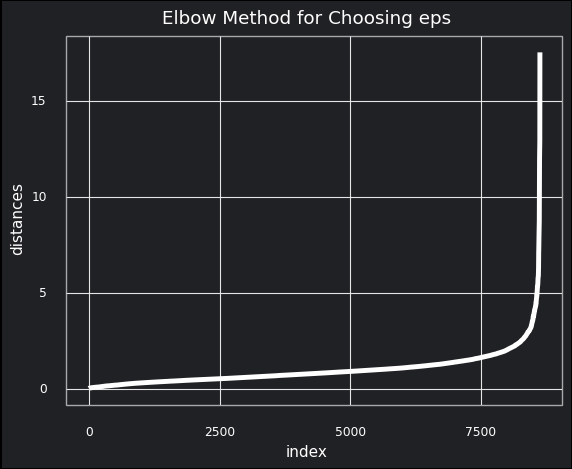

<ggplot: (8728850781326)>

In [48]:
plt = (ggplot(distances_df, aes(x = "index", y = "distances")) +
 geom_line(color = "white", size = 2) + theme_minimal() +
 labs(title = "Elbow Method for Choosing eps") +
 theme(panel_grid_minor = element_blank(),
      rect = element_rect(fill = "#202124ff"),
      axis_text = element_text(color = "white"),
      axis_title = element_text(color = "white"),
      plot_title = element_text(color = "white"),
      panel_border = element_line(color = "darkgray"),
      plot_background = element_rect(fill = "#202124ff")
      ))
ggsave(plot=plt, filename='elbow.png', dpi=300)

plt # the 

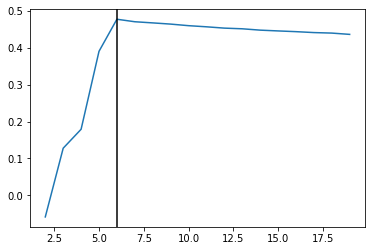

In [93]:
silhoutte_function_dbscan(df_logged_scaled , 2)

In [94]:
df_with_labels = df_logged_scaled.copy()
db3 = DBSCAN(eps = 2 , min_samples = 6).fit(df_logged_scaled)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db3.labels_)))]

df_with_labels["assignments"] = db3.labels_
df_with_labels["assignments"].value_counts()

 0    8014
-1     622
Name: assignments, dtype: int64

In [40]:
tsne_projection = tsne_function(df_logged_scaled)


################# performing tsne ###################


/home/anter/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



======================done=========================


In [95]:
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=df_with_labels['assignments'])


## DBSCAN with pca

In [54]:
pca = PCA(n_components=0.95) 
df_pca = pd.DataFrame(pca.fit_transform(df_logged_scaled))
print (pca.explained_variance_ratio_)
print('\n sum of explained variance is ',np.sum(pca.explained_variance_ratio_))
print('number of components is %d'%len(pca.explained_variance_ratio_))


[0.27231177 0.20374308 0.08918334 0.07573609 0.06276618 0.05712786
 0.04916188 0.04210734 0.03681697 0.03081508 0.02363804 0.0177454 ]

 sum of explained variance is  0.9611530116230537
number of components is 12


/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: elbow.png


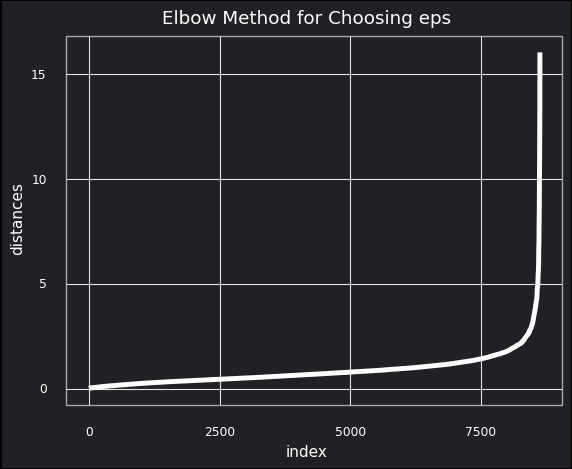

<ggplot: (8728850520601)>

In [57]:
mins = 2 #mins+1
nn = NearestNeighbors(n_neighbors = mins + 1)

nn.fit(df_pca)

distances, neighbors = nn.kneighbors(df_pca)

distances = np.sort(distances[:, mins], axis = 0)

#plot the distances
distances_df = pd.DataFrame({"distances": distances,
                              "index": list(range(0,len(distances)))})

my_plt = (ggplot(distances_df, aes(x = "index", y = "distances")) +
 geom_line(color = "white", size = 2) + theme_minimal() +
 labs(title = "Elbow Method for Choosing eps") +
 theme(panel_grid_minor = element_blank(),
      rect = element_rect(fill = "#202124ff"),
      axis_text = element_text(color = "white"),
      axis_title = element_text(color = "white"),
      plot_title = element_text(color = "white"),
      panel_border = element_line(color = "darkgray"),
      plot_background = element_rect(fill = "#202124ff")
      ))
ggsave(plot=plt, filename='elbow.png', dpi=300)

my_plt # the 


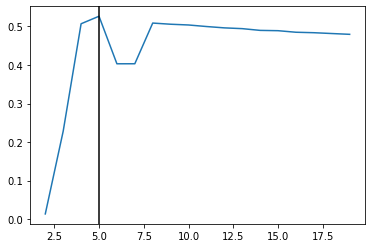

In [92]:
silhoutte_function_dbscan(df_pca , 2)

In [78]:
df_with_labels = df_pca.copy()
db3 = DBSCAN(eps = 2 , min_samples = 5).fit(df_pca)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db3.labels_)))]

df_with_labels["assignments"] = db3.labels_
df_with_labels["assignments"].value_counts()

 0    8206
-1     430
Name: assignments, dtype: int64

In [79]:
df_with_labels['assignments'] = df_with_labels['assignments'] == 0
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=df_with_labels['assignments'])


## kernel pca (rbf)

In [63]:
kpca = KernelPCA(n_components=10 , kernel='rbf')
df_kpca = pd.DataFrame(kpca.fit_transform(df_logged_scaled))

/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 6.4 x 4.8 in image.
/home/anter/.local/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: elbow.png


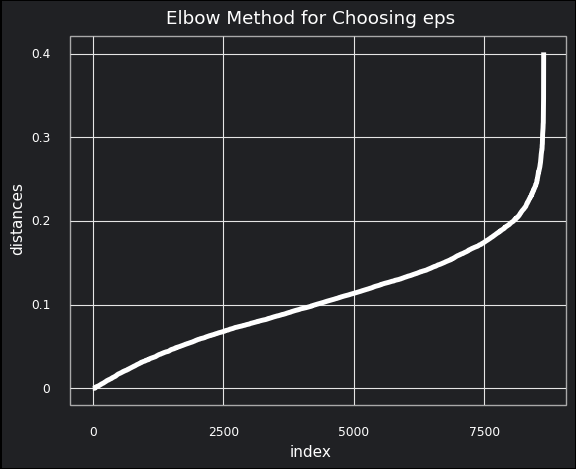

<ggplot: (8728850389788)>

In [64]:
mins = 2 #mins+1
nn = NearestNeighbors(n_neighbors = mins + 1)

nn.fit(df_kpca)

distances, neighbors = nn.kneighbors(df_kpca)

distances = np.sort(distances[:, mins], axis = 0)

#plot the distances
distances_df = pd.DataFrame({"distances": distances,
                              "index": list(range(0,len(distances)))})

my_plt = (ggplot(distances_df, aes(x = "index", y = "distances")) +
 geom_line(color = "white", size = 2) + theme_minimal() +
 labs(title = "Elbow Method for Choosing eps") +
 theme(panel_grid_minor = element_blank(),
      rect = element_rect(fill = "#202124ff"),
      axis_text = element_text(color = "white"),
      axis_title = element_text(color = "white"),
      plot_title = element_text(color = "white"),
      panel_border = element_line(color = "darkgray"),
      plot_background = element_rect(fill = "#202124ff")
      ))
ggsave(plot=plt, filename='elbow.png', dpi=300)

my_plt # the 

In [68]:
df_with_labels = df_kpca.copy()
db3 = DBSCAN(eps = 0.18 , min_samples = 3).fit(df_kpca)

labsList = ["Noise"]
labsList = labsList  + ["Cluster " + str(i) for i in range(1,len(set(db3.labels_)))]

df_with_labels["assignments"] = db3.labels_
df_with_labels["assignments"].value_counts()

 0     7757
-1      671
 16      27
 12      12
 9       11
 6       11
 10      11
 19       8
 2        6
 4        6
 13       5
 25       5
 5        5
 7        5
 14       5
 3        5
 18       4
 26       4
 17       4
 33       4
 8        4
 38       3
 23       3
 41       3
 31       3
 37       3
 39       3
 34       3
 36       3
 28       3
 24       3
 22       3
 1        3
 20       3
 40       3
 27       3
 32       3
 29       3
 11       3
 21       3
 15       3
 35       3
 30       3
Name: assignments, dtype: int64

In [74]:
df_with_labels['assignments'] = (df_with_labels['assignments'] == 0)

In [123]:
def silhoutte_function_dbscan(df , eps):
    '''this silhoutte function for the kmeans'''
    range_min_samples = list(range(2,20))
    silhoutte_score = []
    best_cluster_model = None 

    for min_samples in range_min_samples:
        cluster_model  = DBSCAN(eps = eps , min_samples = min_samples).fit(df)
        cluster_labels = cluster_model.labels_

        silhouette_avg = silhouette_score(df , cluster_labels)
        silhoutte_score += [silhouette_avg]

        if silhouette_avg >= np.max(silhoutte_score):
            best_min_samples = min_samples
    plt.plot(range_min_samples, silhoutte_score)
    plt.axvline(best_min_samples, color='black')
    return best_cluster_model


def silhoutte_function_gmm(df ):
    '''this silhoutte function for the kmeans'''
    range_number_clusters = list(range(2,11))
    silhoutte_score = []
    best_cluster_model = None 

    for n_clusters in range_number_clusters:
        EM = GaussianMixture(n_components=n_clusters ,covariance_type='full', random_state=42).fit(df)
        cluster_labels = EM.predict(df)

        silhouette_avg = silhouette_score(df , cluster_labels)
        silhoutte_score += [silhouette_avg]

        if silhouette_avg >= np.max(silhoutte_score):
            best_n_clusters = n_clusters
    plt.plot(range_number_clusters, silhoutte_score)
    plt.axvline(best_n_clusters, color='black')
    return best_cluster_model


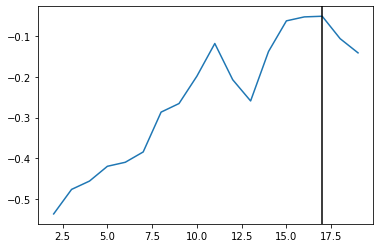

In [98]:
silhoutte_function_dbscan(df_kpca , 0.18)

In [76]:
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=df_with_labels['assignments'])


#### on seeing that i don't think kpca is better than pca here
kernel pca takes the features into new space and thus it is not a linear dimensionality reduction


according to silhoutte score : using all features or pca features is better than kpca

# using EM

In [127]:
from sklearn.mixture import GaussianMixture
EM = GaussianMixture(n_components=2,covariance_type='diag', random_state=42).fit(df_logged_scaled)
prediction = EM.predict(df_logged_scaled)

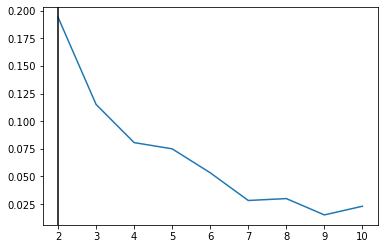

In [124]:
silhoutte_function_gmm(df_logged_scaled)

In [128]:
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=prediction)


## trying on pca

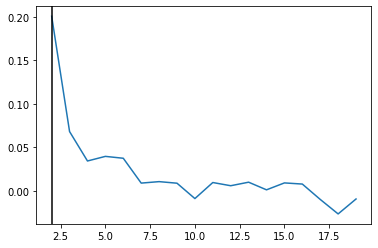

In [122]:
silhoutte_function_gmm(df_pca)

In [112]:
EM = GaussianMixture(n_components=2,covariance_type='diag', random_state=42).fit(df_pca)
prediction = EM.predict(df_pca)
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=prediction)


## trying on kpca

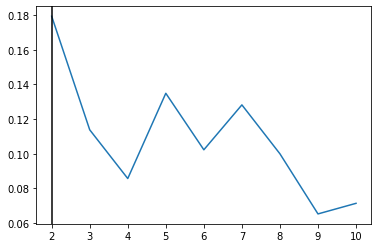

In [125]:
silhoutte_function_gmm(df_kpca)

In [126]:
EM = GaussianMixture(n_components=2,covariance_type='full', random_state=42).fit(df_kpca)
prediction = EM.predict(df_kpca)
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=prediction)


### comment : EM fails to make clustering on this data
reason:

EM assumes the clusters to be gaussian distributed with unknown parameters

although features are standard scaled not all the features are in normal distribution (there are alot of skewed features ) and may be that causes the EM to fail

## isolation forest

In [147]:
from sklearn.ensemble import IsolationForest
isolation_forest = IsolationForest(n_estimators=100 , n_jobs=-1 , random_state=42)
isolation_forest.fit(df_logged_scaled)
predictions = isolation_forest.predict(df_logged_scaled)
print(set(predictions) )

silhouette_avg = silhouette_score(df_logged_scaled , predicitions)
silhouette_avg

{1, -1}


0.42937933080809115

In [135]:
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=predictions)

### isolation forest on pca

In [146]:
isolation_forest = IsolationForest(n_estimators=100 , n_jobs=-1 , random_state=42)
isolation_forest.fit(df_pca)
predictions = isolation_forest.predict(df_pca)
silhouette_avg = silhouette_score(df_pca , predicitions)
print(silhouette_avg)
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=predictions)


0.43029134803644375


## trying isolated forest with kpca

In [145]:
isolation_forest = IsolationForest(n_estimators=100 , n_jobs=-1 , random_state=42)
isolation_forest.fit(df_kpca)
predictions = isolation_forest.predict(df_kpca)
silhouette_avg = silhouette_score(df_kpca , predicitions)
print(silhouette_avg)
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=predictions)


0.06661366562098368


#### comment : isolated forest performed good on pca and the whole features

In [148]:
isolation_forest = IsolationForest(n_estimators=100 , n_jobs=-1 , random_state=42)
isolation_forest.fit(df_raw)
predictions = isolation_forest.predict(df_raw)
silhouette_avg = silhouette_score(df_raw , predicitions)
print(silhouette_avg)
px.scatter( x = tsne_projection[0] , y = tsne_projection[1]  , color=predictions)


0.5452894635690052


#### isolated forest performed better in the whole data without scaling